In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

In [ ]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
# figure size in inches optional
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [ ]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [ ]:
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [ ]:
# Fetch all post disaster json files
labels_generator = Path('/content/drive/MyDrive/ML/geotiffs/tier1/labels').rglob(pattern=f'*post_*.json')

In [ ]:
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [ ]:
disaster_dict = get_disaster_dict(labels_generator)

In [ ]:
disaster_dict.keys()

dict_keys(['hurricane-florence', 'hurricane-harvey', 'hurricane-matthew', 'socal-fire', 'mexico-earthquake', 'midwest-flooding', 'hurricane-michael', 'santa-rosa-wildfire', 'palu-tsunami', 'guatemala-volcano'])

In [ ]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [ ]:
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [ ]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [ ]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw


In [ ]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','tif')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    img = io.imread(img_path)

    img = np.array(img)

    plt.imshow(img,interpolation='nearest')

    plt.show()

In [ ]:
from PIL import Image
from skimage import io
from matplotlib import pyplot as plt

In [ ]:
def plot_image(label):
  
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)

In [ ]:
disaster_labels = disaster_dict['hurricane-florence']

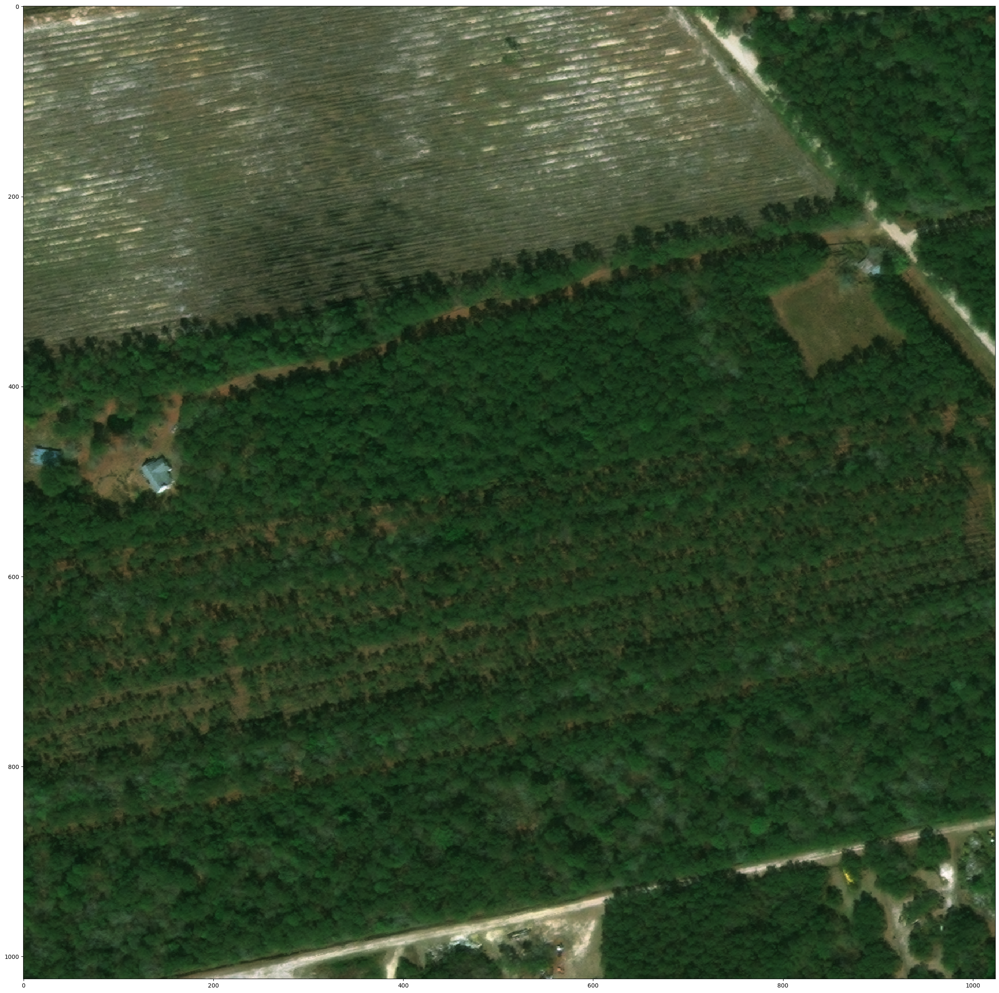

In [ ]:
display_img(disaster_labels[0], time='pre', annotated=True)

In [ ]:
import json
f = open(disaster_labels[3])
json.load(f)

{'features': {'lng_lat': [{'properties': {'feature_type': 'building',
     'subtype': 'no-damage',
     'uid': '2a4cf9b8-8ecc-4118-b96d-8679a991bddf'},
    'wkt': 'POLYGON ((-77.94894812637826 34.6883707345343, -77.94889414768491 34.68839422521823, -77.9487265256421 34.68822915486816, -77.94879836271785 34.6881781491383, -77.94897664267286 34.68833955051016, -77.94894812637826 34.6883707345343))'},
   {'properties': {'feature_type': 'building',
     'subtype': 'no-damage',
     'uid': 'b08403d5-d81b-4aaf-94e0-8478450523d8'},
    'wkt': 'POLYGON ((-77.94909301556233 34.68808553542394, -77.94906594415788 34.68811379799288, -77.94902142983247 34.68814027441795, -77.94895266676781 34.6880676643875, -77.94900917460801 34.68803083143167, -77.94898035234324 34.68799992152834, -77.9490352783545 34.68796546302782, -77.94912440745684 34.68806600244447, -77.94909301556233 34.68808553542394))'},
   {'properties': {'feature_type': 'building',
     'subtype': 'no-damage',
     'uid': '883ab8dc-270e-

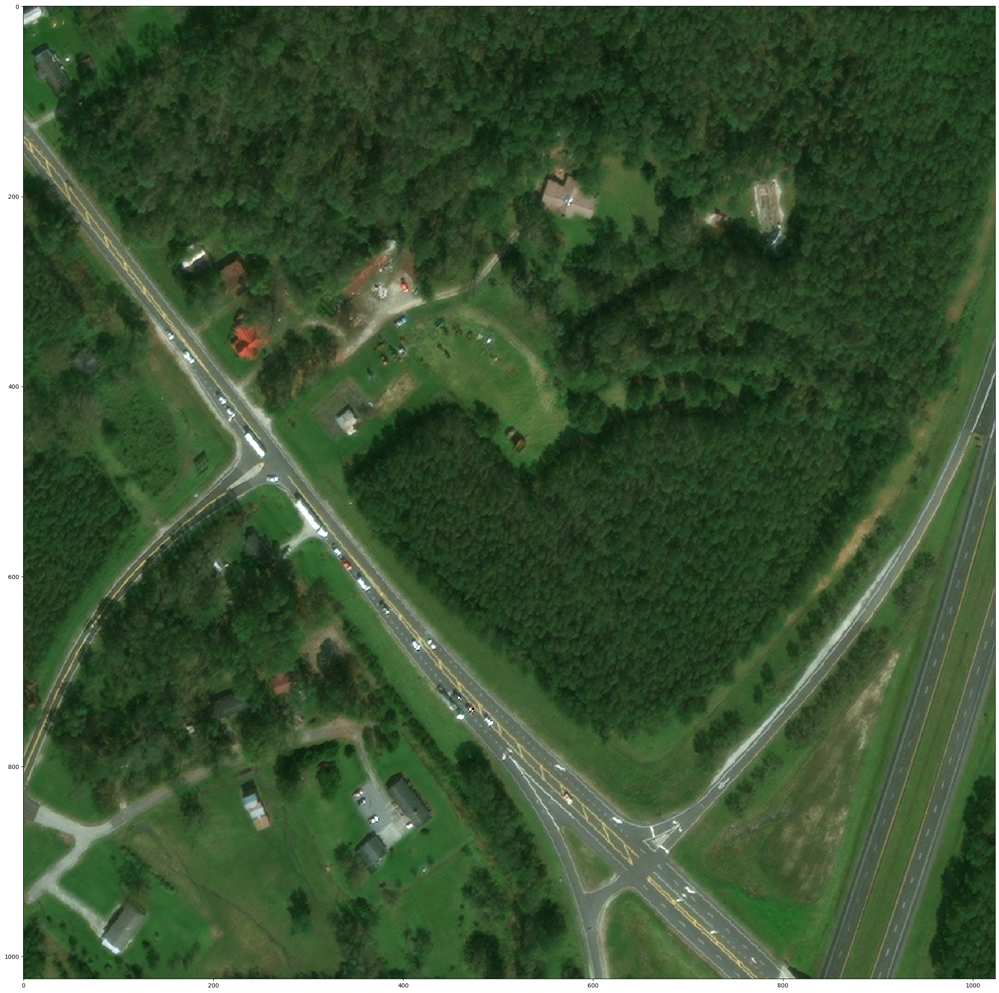

In [ ]:
display_img(disaster_labels[3], time='post', annotated=True)

In [ ]:
#plot_image(row.path)

In [ ]:
# Get polygons center coords (lat, long)
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    if centroid:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    else:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [ ]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [ ]:
# Add centroid and damage dict to metadata
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']
        

In [ ]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [ ]:
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

<ipython-input-42-62f4b730c532>:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return df.fillna(df.mean())


In [ ]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "major-damage": '#ffff00',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [ ]:
sorted_df

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,no-damage,major-damage,minor-damage,un-classified,destroyed
311,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000475_post_disaster.png,-77.923664,34.769367,POINT (-77.92366426303177 34.76936651022162),/content/drive/MyDrive/ML/geotiffs/tier1/label...,7.000000,9.07971,2.315789,4.230769,28.000000
156,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000018_post_disaster.png,-77.877277,34.594979,POINT (-77.8772773570387 34.59497927543934),/content/drive/MyDrive/ML/geotiffs/tier1/label...,24.353234,42.00000,2.315789,4.230769,5.000000
26,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000147_post_disaster.png,-77.878871,34.554557,POINT (-77.87887148297388 34.55455738229168),/content/drive/MyDrive/ML/geotiffs/tier1/label...,24.353234,9.07971,2.315789,4.230769,4.000000
179,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000497_post_disaster.png,-77.863019,34.645554,POINT (-77.86301921572272 34.64555351423584),/content/drive/MyDrive/ML/geotiffs/tier1/label...,24.353234,9.07971,2.315789,4.230769,4.000000
0,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000023_post_disaster.png,-77.899043,34.620137,POINT (-77.89904301036002 34.62013730631419),/content/drive/MyDrive/ML/geotiffs/tier1/label...,3.000000,9.07971,2.315789,4.230769,3.857143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000510_post_disaster.png,-77.901375,34.829738,POINT (-77.90137463396945 34.82973750677511),/content/drive/MyDrive/ML/geotiffs/tier1/label...,29.000000,9.07971,2.315789,4.230769,1.000000
297,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000341_post_disaster.png,-77.960840,34.671806,POINT (-77.96084019597296 34.67180587566218),/content/drive/MyDrive/ML/geotiffs/tier1/label...,24.353234,9.07971,2.000000,2.000000,1.000000
258,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000537_post_disaster.png,-77.942298,34.856692,POINT (-77.9422978353072 34.85669177934597),/content/drive/MyDrive/ML/geotiffs/tier1/label...,16.000000,9.07971,2.315789,4.000000,1.000000
100,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.94543,53.722378,190.82309,hurricane-florence,...,hurricane-florence_00000508_post_disaster.png,-77.867051,34.790131,POINT (-77.86705093363341 34.790130859551134),/content/drive/MyDrive/ML/geotiffs/tier1/label...,24.353234,10.00000,2.315789,1.000000,1.000000


In [ ]:
df_generator = sorted_df.iterrows()

In [ ]:
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

In [ ]:
index, row = next(df_generator)

In [ ]:
# provides google maps link
generate_gmaps_link(row.centroid_y, row.centroid_x)
##havent figured out the location yet!

In [ ]:
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

no-damage             7.0
minor-damage     2.315789
major-damage      9.07971
destroyed            28.0
un-classified    4.230769
Name: 311, dtype: object

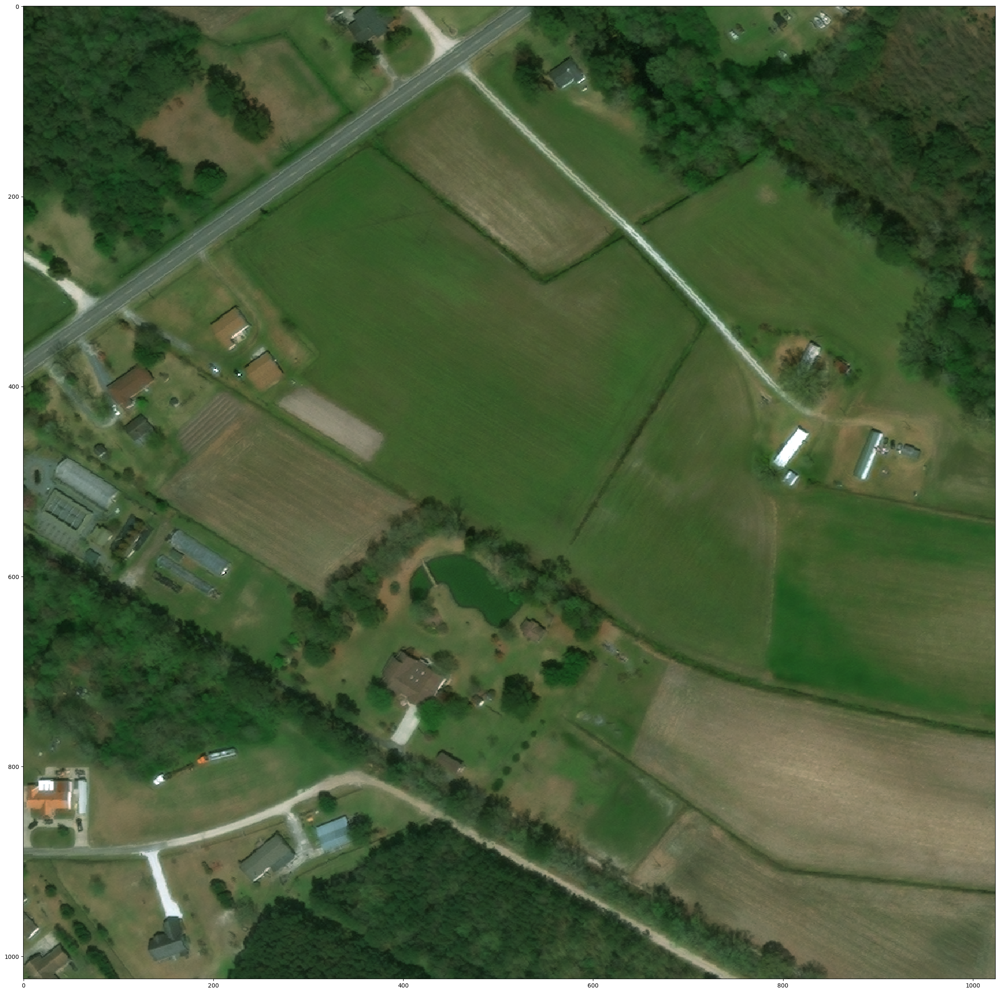

In [ ]:
display_img(row.path, time='pre', annotated=True)

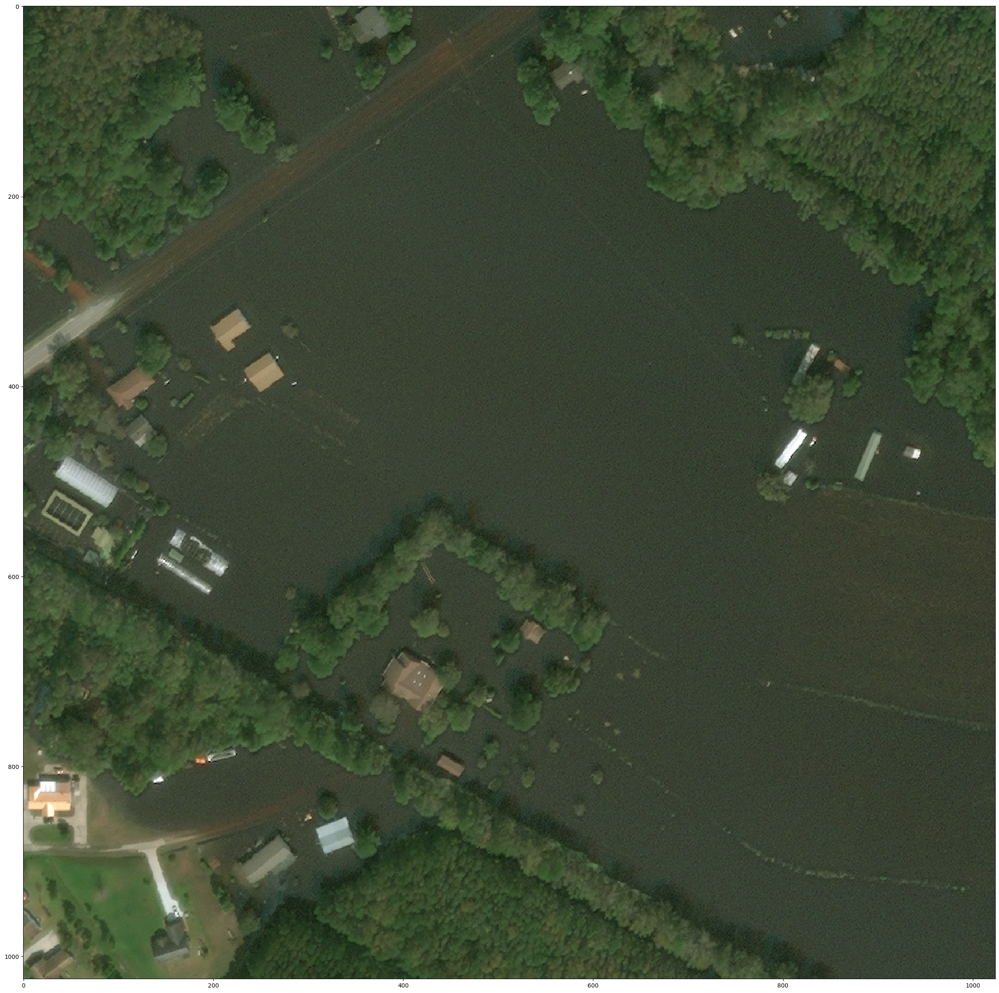

In [ ]:
display_img(row.path, time='post', annotated=True)

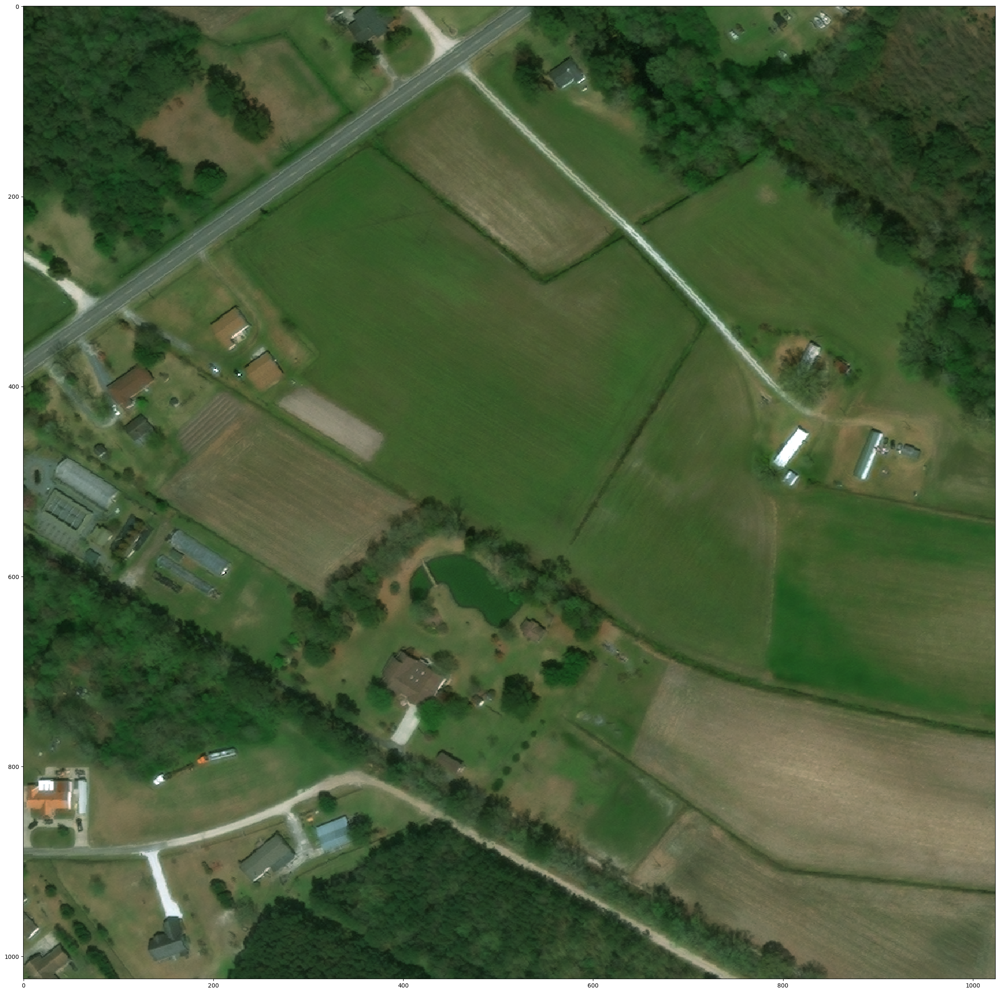

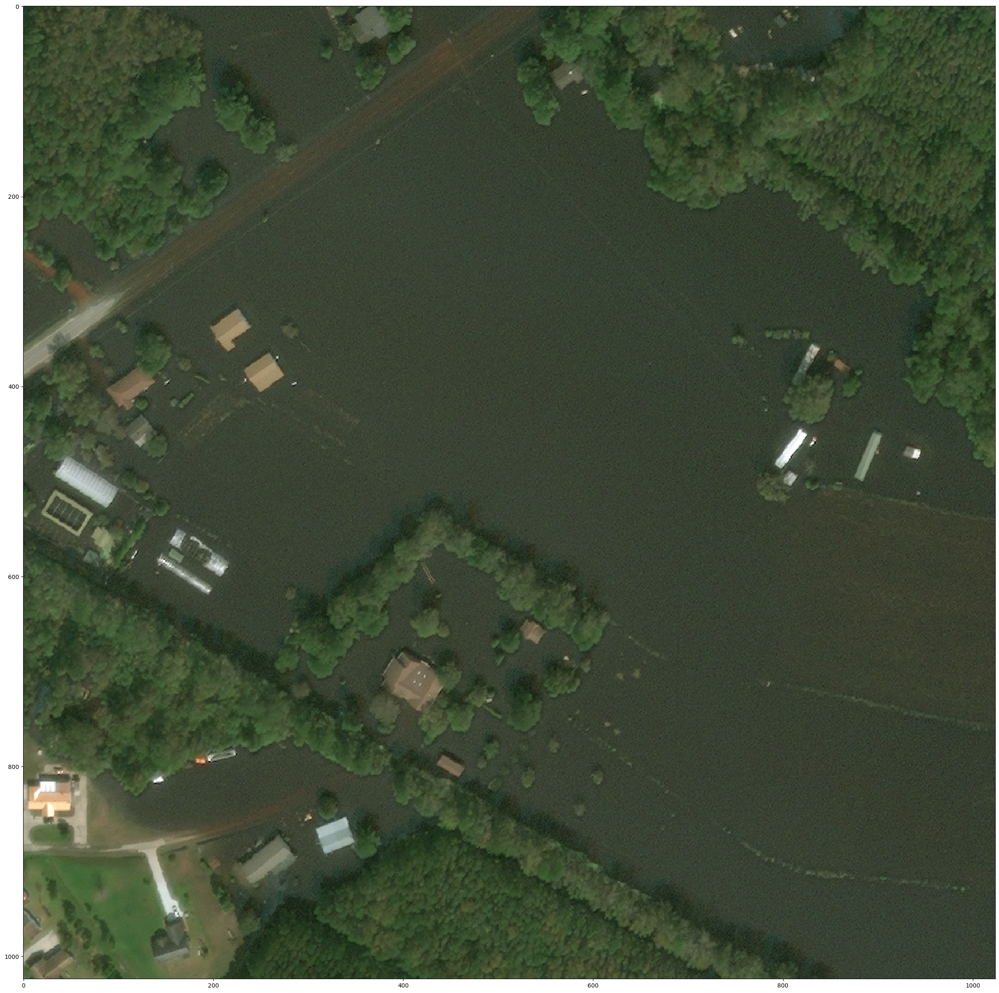

In [ ]:
plot_image(row.path)

In [ ]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "major-damage": '#ffff00',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [ ]:
location = df.mean().loc[['centroid_y','centroid_x']].tolist()

<ipython-input-53-29da55392079>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  location = df.mean().loc[['centroid_y','centroid_x']].tolist()


In [ ]:

# mean latitude and longitude
# Create a map
m_2 = folium.Map(location=location, tiles='openstreetmap', zoom_start=13)

# Add points to the map
for idx, row in df.iterrows():
    generator = generate_circle(row)
    for circle in generator:
        circle.add_to(m_2)

# Display the map
embed_map(m_2, 'm_2.html')

In [ ]:
labels_generator = Path('/content/drive/MyDrive/ML/geotiffs/tier1/labels').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

<ipython-input-53-62f4b730c532>:4: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return df.fillna(df.mean())


In [ ]:
full_df

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,no-damage,major-damage,minor-damage,un-classified,destroyed
0,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.945430,53.722378,190.823090,hurricane-florence,...,hurricane-florence_00000023_post_disaster.png,-77.899043,34.620137,POINT (-77.89904301036002 34.62013730631419),/content/drive/MyDrive/ML/geotiffs/tier1/label...,3.000000,16.005241,17.821793,4.379747,14.583153
1,GEOEYE01,GEOEYE01,2.091625,2018-09-20T16:04:41.000Z,28.017313,0.522825,153.945430,53.722378,190.823090,hurricane-florence,...,hurricane-florence_00000473_post_disaster.png,-77.927636,34.768905,POINT (-77.92763628416073 34.76890464175944),/content/drive/MyDrive/ML/geotiffs/tier1/label...,29.000000,5.000000,1.000000,4.379747,14.583153
2,WORLDVIEW02,WORLDVIEW02,2.125994,2018-10-23T18:51:21.000Z,21.787466,0.530760,163.631590,42.702580,346.045320,socal-fire,...,socal-fire_00000277_pre_disaster.png,-86.179915,29.501344,None,/content/drive/MyDrive/ML/geotiffs/tier1/label...,70.098035,16.005241,17.821793,4.379747,14.583153
3,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.914360,0.753211,152.306080,66.449990,111.736275,hurricane-harvey,...,hurricane-harvey_00000438_post_disaster.png,-95.538815,29.746889,POINT (-95.53881521958571 29.746888658606448),/content/drive/MyDrive/ML/geotiffs/tier1/label...,32.000000,83.000000,29.000000,1.000000,14.583153
4,WORLDVIEW02,WORLDVIEW02,2.378877,2016-10-01T15:29:45.000Z,29.441723,0.598201,137.923859,61.575718,347.941803,hurricane-matthew,...,hurricane-matthew_00000051_post_disaster.png,-73.793500,18.198990,POINT (-73.793499677197 18.198990050025465),/content/drive/MyDrive/ML/geotiffs/tier1/label...,15.000000,16.005241,42.000000,4.000000,14.583153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5804,GEOEYE01,GEOEYE01,2.071191,2018-10-13T16:48:15.000Z,28.866730,0.517116,163.926380,50.756794,112.555626,hurricane-michael,...,hurricane-michael_00000440_post_disaster.png,-85.681391,30.189195,POINT (-85.68139144495119 30.18919467024093),/content/drive/MyDrive/ML/geotiffs/tier1/label...,78.000000,33.000000,48.000000,4.379747,9.000000
5805,WORLDVIEW02,WORLDVIEW02,2.824743,2018-10-01T02:26:02.000Z,36.436947,0.703520,96.501620,68.848434,221.880360,palu-tsunami,...,palu-tsunami_00000106_post_disaster.png,119.807187,-0.806082,POINT (119.8071867997837 -0.8060818128524095),/content/drive/MyDrive/ML/geotiffs/tier1/label...,96.000000,3.000000,17.821793,1.000000,2.000000
5806,GEOEYE01,GEOEYE01,2.895928,2018-09-18T16:32:47.000Z,41.741340,0.722669,162.699550,57.024815,69.022140,hurricane-florence,...,hurricane-florence_00000015_post_disaster.png,-78.981534,33.631207,POINT (-78.9815342422075 33.63120728944395),/content/drive/MyDrive/ML/geotiffs/tier1/label...,106.000000,16.005241,17.821793,4.379747,14.583153
5807,WORLDVIEW02,WORLDVIEW02,2.650321,2017-09-20T17:46:11.000Z,34.376244,0.660409,148.530000,68.674000,105.509130,mexico-earthquake,...,mexico-earthquake_00000057_post_disaster.png,-99.169591,19.288867,POINT (-99.16959082802603 19.288866754649515),/content/drive/MyDrive/ML/geotiffs/tier1/label...,342.000000,16.005241,1.000000,4.379747,14.583153


In [ ]:
def plot_bargraph(df, x, y, agg_func, x_label, y_label):
  new_df = df.groupby('disaster', as_index=False).agg(agg_func)

  for index, row in new_df.iterrows():
    plt.bar(row.disaster, row.gsd, label=row.disaster, align='center')
    
#   plt.legend(loc=1,prop={'size':18})

  plt.xticks(fontsize=40, rotation=75)
  plt.xlabel(x_label, fontsize=40)
  plt.ylabel(y_label, fontsize=40)
  plt.yticks(fontsize=25)
  fig = plt.gcf()
  fig.set_size_inches(20, 20)
  plt.savefig(f'{agg_func}.png', dpi=100)
  plt.show()

In [1]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean', x_label='disaster', y_label='ground sample distance (spatial resolution)')
#The Ground Sampling Distance will help us get an idea on the spatial resolution of the images per disaster. This has help us normalize the images to a specific resolution during training.

NameError: ignored

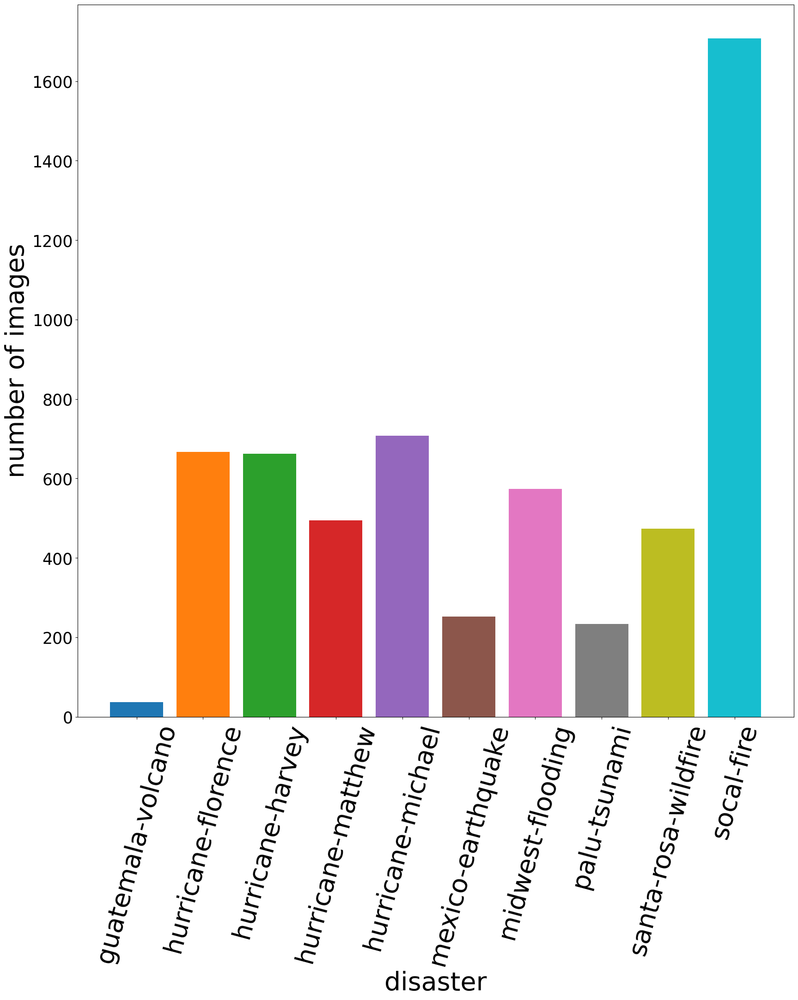

In [ ]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count', x_label='disaster', y_label='number of images')

In [ ]:
full_df['gsd'].mean()